# Flower Recognition

###  4242 foto var - 5 tip cicek var 


# Importing Libraries

In [1]:
import sys
print(sys.prefix)

c:\Users\ASUS\AppData\Local\Programs\Python\Python311


In [2]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
from IPython.display import Image, display
import matplotlib.cm as cm

import tensorflow as tf 
import requests
from PIL import Image
from io import BytesIO
import os
import shutil
from tqdm import tqdm
from random import shuffle

import cv2
from glob import glob

from tensorflow.keras import backend as K
import random
import albumentations as A
from sklearn.model_selection import train_test_split, StratifiedKFold

from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.models import *
from tensorflow.keras.preprocessing.image import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.applications.efficientnet import *
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings("ignore")

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.8 (you have 1.4.7). Upgrade using: pip install --upgrade albumentations


# *Step 2: Loading Dataset*

In [3]:
image_dir = Path('C:/Users/ASUS/Desktop/ANN/flowers')

filepaths = list(image_dir.glob(r'**/*.jpg'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

image_df = pd.concat([filepaths, labels], axis=1)

### 2.1 Viewing Dataset

In [4]:

image_df.head()


,Filepath,Label
0,C:\Users\ASUS\Desktop\ANN\flowers\daisy\100080...,daisy
1,C:\Users\ASUS\Desktop\ANN\flowers\daisy\101403...,daisy
2,C:\Users\ASUS\Desktop\ANN\flowers\daisy\101723...,daisy
3,C:\Users\ASUS\Desktop\ANN\flowers\daisy\101725...,daisy
4,C:\Users\ASUS\Desktop\ANN\flowers\daisy\101726...,daisy


In [5]:

image_df.tail()

,Filepath,Label
4312,C:\Users\ASUS\Desktop\ANN\flowers\tulip\983136...,tulip
4313,C:\Users\ASUS\Desktop\ANN\flowers\tulip\987055...,tulip
4314,C:\Users\ASUS\Desktop\ANN\flowers\tulip\994737...,tulip
4315,C:\Users\ASUS\Desktop\ANN\flowers\tulip\994738...,tulip
4316,C:\Users\ASUS\Desktop\ANN\flowers\tulip\997651...,tulip


In [6]:
image_df.isnull().sum()


Filepath    0
Label       0
dtype: int64

In [7]:
image_df = image_df.sample(frac=1).reset_index(drop = True)
image_df.head(5)

,Filepath,Label
0,C:\Users\ASUS\Desktop\ANN\flowers\sunflower\41...,sunflower
1,C:\Users\ASUS\Desktop\ANN\flowers\daisy\770233...,daisy
2,C:\Users\ASUS\Desktop\ANN\flowers\sunflower\82...,sunflower
3,C:\Users\ASUS\Desktop\ANN\flowers\daisy\247995...,daisy
4,C:\Users\ASUS\Desktop\ANN\flowers\tulip\266856...,tulip


### 2.2 *Shape of Dataset*

In [8]:
image_df.shape

(4317, 2)

### 2.3 *Displaying Dataset*

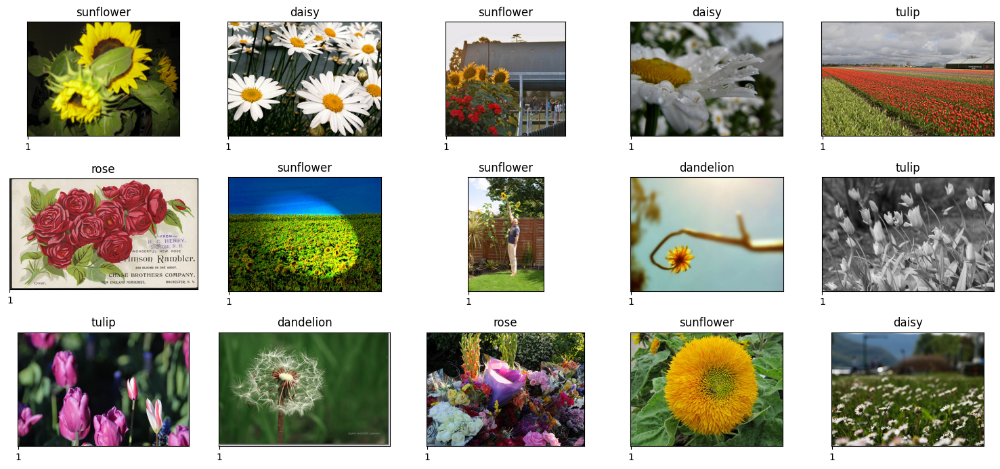

In [9]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 7),
                        subplot_kw={'xticks': [1], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

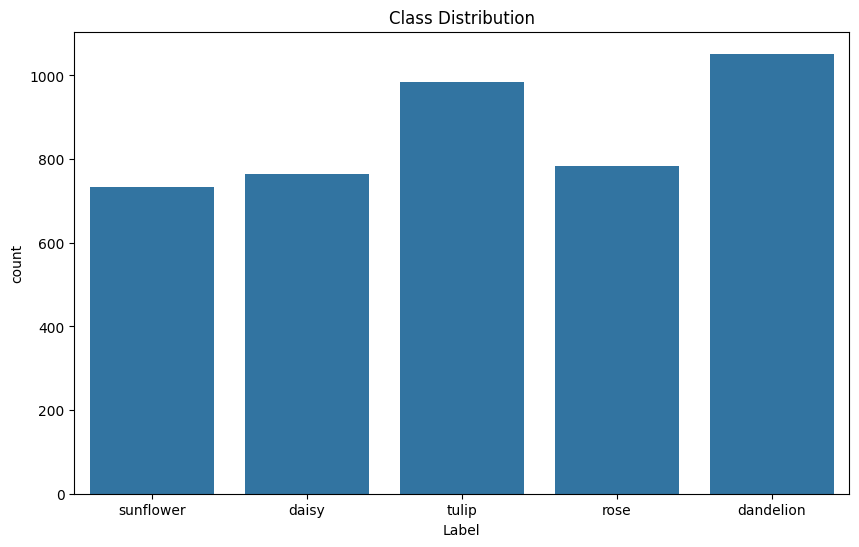

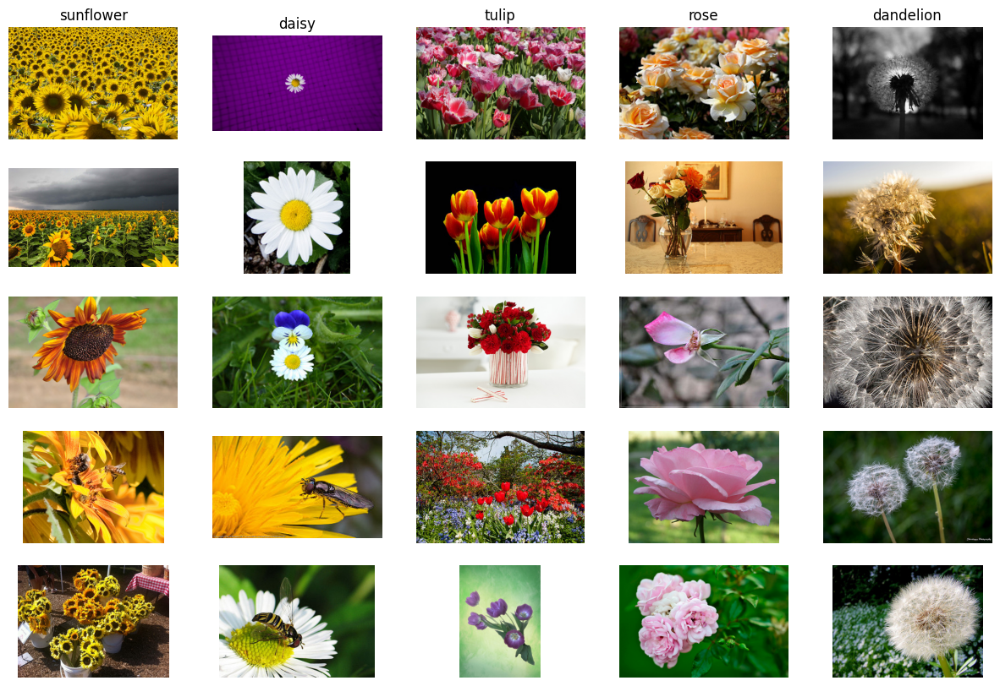

In [10]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=image_df, x='Label')
plt.title('Class Distribution')
plt.show()

# Display sample images from each class
def display_samples(df, n=5):
    fig, axes = plt.subplots(nrows=n, ncols=len(df['Label'].unique()), figsize=(15, 10))
    for i, label in enumerate(df['Label'].unique()):
        sample_images = df[df['Label'] == label].sample(n)
        for j, filepath in enumerate(sample_images['Filepath']):
            img = plt.imread(filepath)
            axes[j, i].imshow(img)
            axes[j, i].axis('off')
            if j == 0:
                axes[j, i].set_title(label)

display_samples(image_df)


# Data Preparation

In [11]:
train_df, test_df = train_test_split(image_df, train_size=0.9, shuffle=True, random_state=1)

In [12]:
train_df.shape

(3885, 2)

### 3.3 **MobilenetV2**

In [13]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
    validation_split=0.2
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
)

In [39]:
train_df.head()

,Filepath,Label
3808,C:\Users\ASUS\Desktop\ANN\flowers\tulip\876864...,tulip
1858,C:\Users\ASUS\Desktop\ANN\flowers\rose\1461381...,rose
2275,C:\Users\ASUS\Desktop\ANN\flowers\sunflower\15...,sunflower
1909,C:\Users\ASUS\Desktop\ANN\flowers\tulip\575546...,tulip
1078,C:\Users\ASUS\Desktop\ANN\flowers\dandelion\19...,dandelion


In [15]:
train_df.tail()

,Filepath,Label
2895,C:\Users\ASUS\Desktop\ANN\flowers\tulip\716655...,tulip
2763,C:\Users\ASUS\Desktop\ANN\flowers\dandelion\73...,dandelion
905,C:\Users\ASUS\Desktop\ANN\flowers\daisy\431800...,daisy
3980,C:\Users\ASUS\Desktop\ANN\flowers\sunflower\95...,sunflower
235,C:\Users\ASUS\Desktop\ANN\flowers\daisy\157601...,daisy


### 3.5 *Train,validation and test Data Shape*

In [16]:
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 3108 validated image filenames belonging to 5 classes.
Found 777 validated image filenames belonging to 5 classes.
Found 432 validated image filenames belonging to 5 classes.


# EDA

DATA ANALYSIS


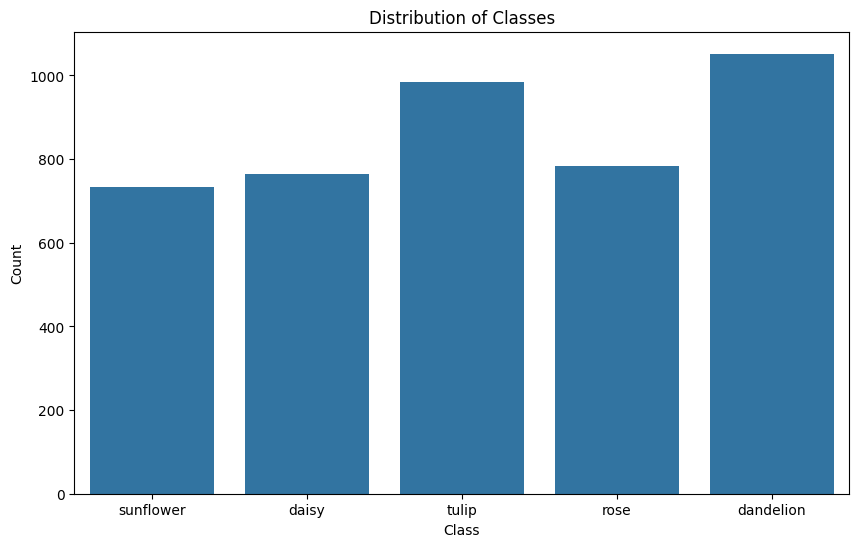

In [40]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Label', data=image_df)
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()


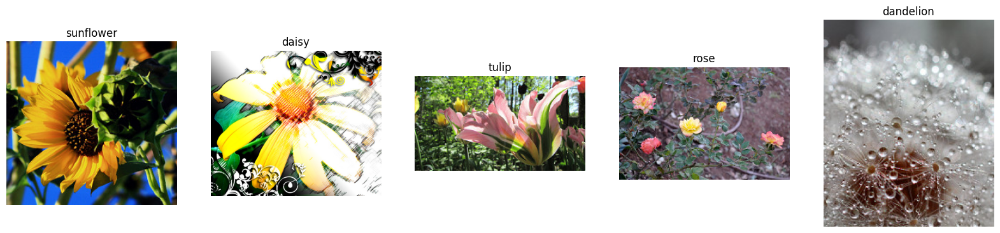

In [18]:
def display_random_samples(df, n=1):
    labels = df['Label'].unique()
    fig, axes = plt.subplots(nrows=1, ncols=len(labels), figsize=(20, 20))
    for i, label in enumerate(labels):
        sample_images = df[df['Label'] == label].sample(n)
        for j, filepath in enumerate(sample_images['Filepath']):
            img = plt.imread(filepath)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(label)

display_random_samples(image_df)


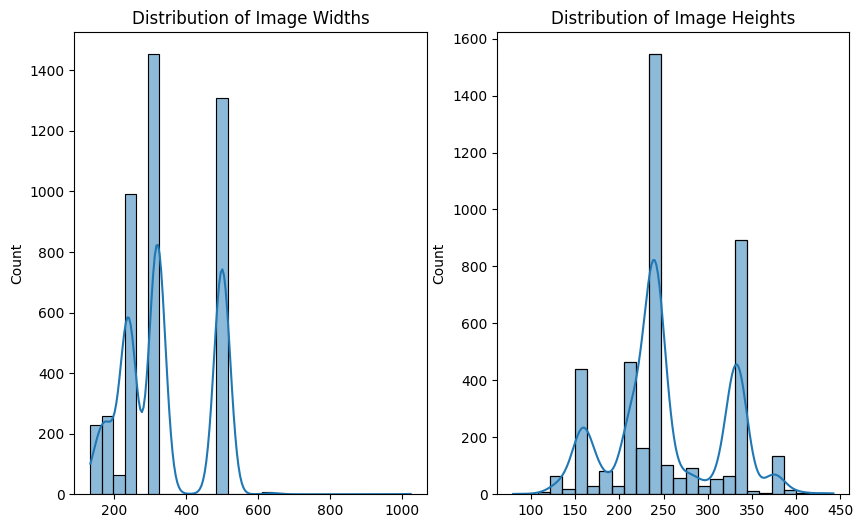

In [19]:
image_sizes = image_df['Filepath'].apply(lambda x: Image.open(x).size)
image_sizes = list(image_sizes)

widths, heights = zip(*image_sizes)

plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
sns.histplot(widths, kde=True)
plt.title('Distribution of Image Widths')

plt.subplot(1, 2, 2)
sns.histplot(heights, kde=True)
plt.title('Distribution of Image Heights')

plt.show()


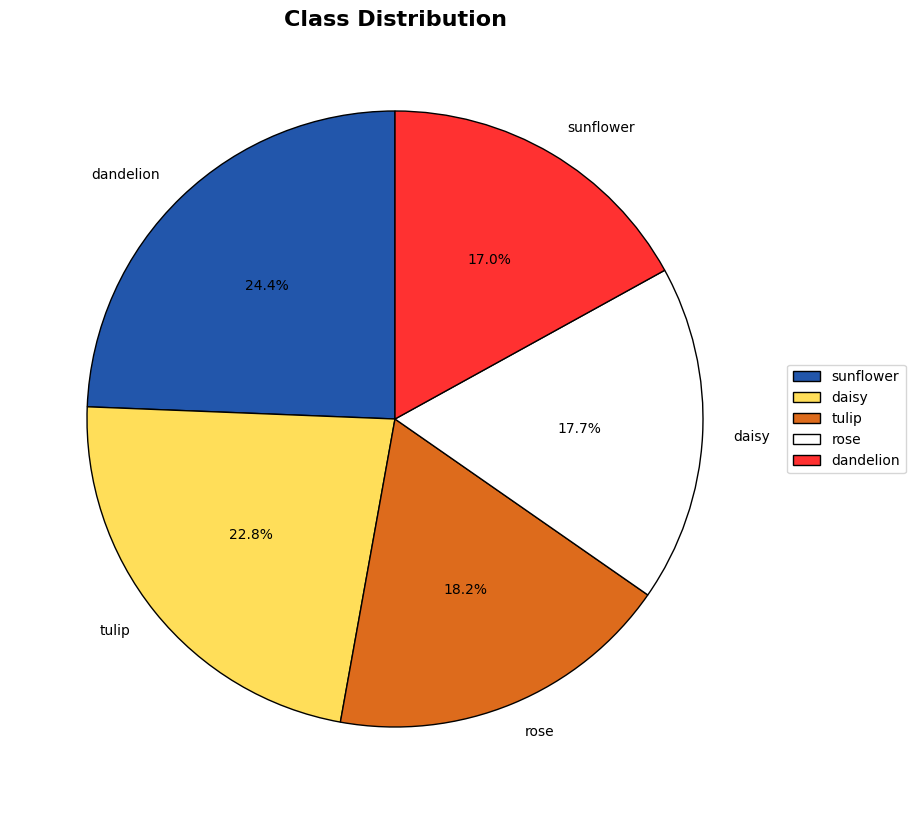

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

custom_colors = ['#2256ab', '#ffde59', '#dd6b1c', '#ffffff', '#ff3131', '#ffde59', '#00bf63']

colors = custom_colors[:len(image_df['Label'].unique())]

plt.figure(figsize=(10, 10))

image_df['Label'].value_counts().plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True}
)

plt.title('Class Distribution', fontsize=16, fontweight='bold')
plt.ylabel('')  

plt.legend(labels=image_df['Label'].unique(), loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()


# Preaparing Model

In [21]:
def create_model(input_shape=(224, 224, 3)):
    
    inputs = Input(input_shape)
    base_model = EfficientNetB1(input_shape=input_shape, include_top=False, classes=5)
    
    x = base_model(inputs)
    
    x = GlobalAveragePooling2D()(x)
#     x = Dropout(0.1)(x)
    
    x = Dense(56, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    outputs = Dense(5, activation='sigmoid')(x)
    
    model = Model(inputs, outputs)
    
    return model
K.clear_session()

model = create_model((224, 224, 3))
# model = load_model('models/checkpoint/EfficientNetB0.h5')

metrics = [
    'accuracy',
    'AUC'
]

In [22]:
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=metrics)
# model.compile(optimizer=Adam(), loss='mean_squared_error', metrics=metrics)
# model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=metrics)



###  4.2 *Callbacks*

In [23]:
checkpoint_path = 'models/EfficientNetB1/model_224.keras'

callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', patience=15, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', mode='min', factor=0.1, patience=5, min_lr=0.000001, verbose=1),
    ModelCheckpoint(monitor='val_loss', mode='min', filepath=checkpoint_path, verbose=1, save_best_only=True, save_weights_only=False)
]


### 4.3 *Fit Model*

In [24]:
%%time
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=30,
    callbacks=callbacks
)

Epoch 1/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - AUC: 0.9002 - accuracy: 0.7520 - loss: 0.6971
Epoch 1: val_loss improved from inf to 5.44978, saving model to models/EfficientNetB1/model_224.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 197s 2s/step - AUC: 0.9006 - accuracy: 0.7529 - loss: 0.6950 - val_AUC: 0.4836 - val_accuracy: 0.2136 - val_loss: 5.4498 - learning_rate: 0.0010
Epoch 2/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - AUC: 0.9794 - accuracy: 0.9096 - loss: 0.2425
Epoch 2: val_loss improved from 5.44978 to 4.44346, saving model to models/EfficientNetB1/model_224.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 166s 2s/step - AUC: 0.9794 - accuracy: 0.9095 - loss: 0.2427 - val_AUC: 0.5070 - val_accuracy: 0.2136 - val_loss: 4.4435 - learning_rate: 0.0010
Epoch 3/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - AUC: 0.9867 - accuracy: 0.9447 - loss: 0.1767
Epoch 3: val_loss improved from 4.44346 to 3.54203, saving model to models/EfficientNetB1/model_224.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 169s 2s/step - AUC: 0.98

### 4.4 *Plotting*

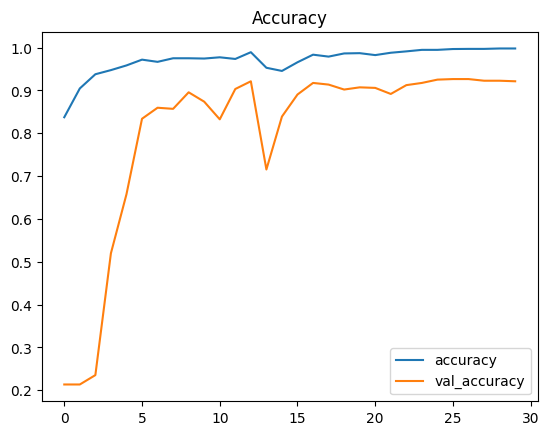

In [25]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()


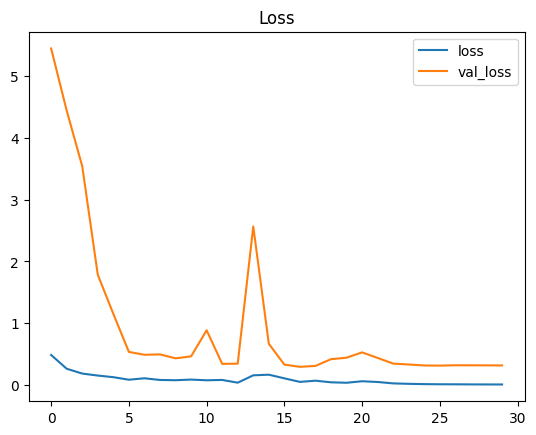

In [26]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

### 4.5 *Evaluate Model*

In [27]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.29440
Test Accuracy: 93.29%


In [28]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb1 (Functional)     │ (None, 7, 7, 1280)     │     6,575,239 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 56)             │        71,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,817,672 (75.60 MB)

 Trainable params: 6,585,205 (25.12 MB)

 Non-trainable params: 62,055 (242.41 KB)

 Optimizer params: 13,170,412 (50.24 MB)

# *Step 5: Prediction*

In [29]:
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

print(f'The first 5 predictions: {pred[:5]}')

14/14 ━━━━━━━━━━━━━━━━━━━━ 9s 482ms/step
The first 5 predictions: ['sunflower', 'rose', 'tulip', 'sunflower', 'sunflower']


### 5.1 *Classification Report*

In [30]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

       daisy       0.93      0.90      0.92        73
   dandelion       0.93      0.95      0.94       109
        rose       0.94      0.87      0.91        71
   sunflower       1.00      0.94      0.97        84
       tulip       0.88      0.97      0.92        95

    accuracy                           0.93       432
   macro avg       0.94      0.93      0.93       432
weighted avg       0.93      0.93      0.93       432



### 5.2 *Confusion Matrix*

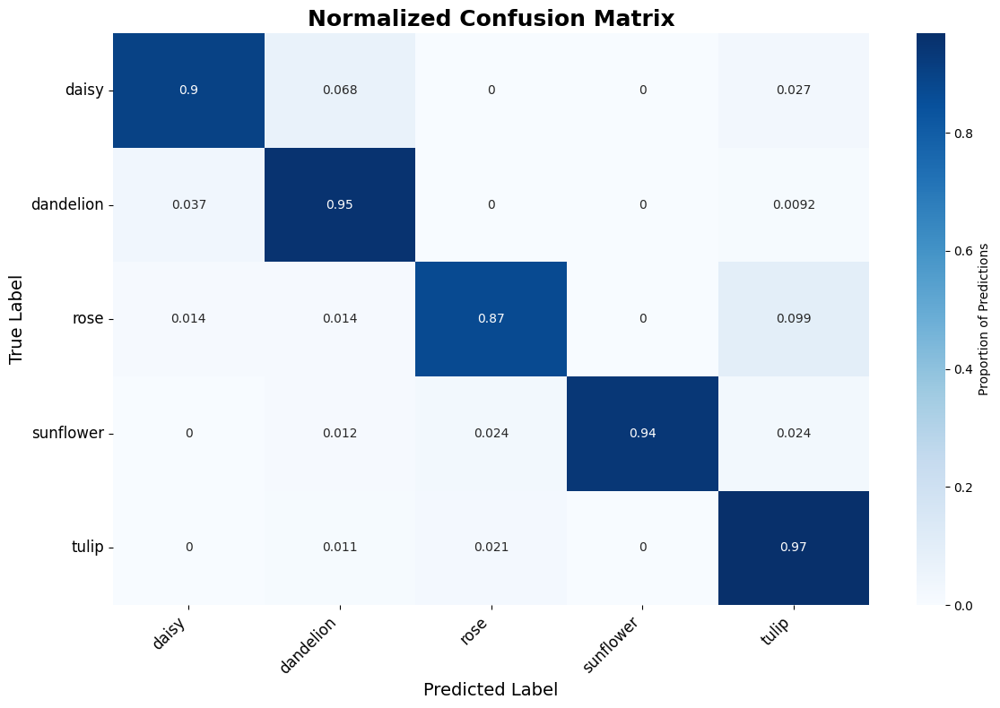

In [31]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, pred, normalize='true')

plt.figure(figsize=(12, 8))

sns.heatmap(cf_matrix, annot=True, cmap='Blues', 
            xticklabels=sorted(set(y_test)), yticklabels=sorted(set(y_test)),
            cbar_kws={'label': 'Proportion of Predictions'})

plt.title('Normalized Confusion Matrix', fontsize=18, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)

plt.tight_layout()
plt.show()


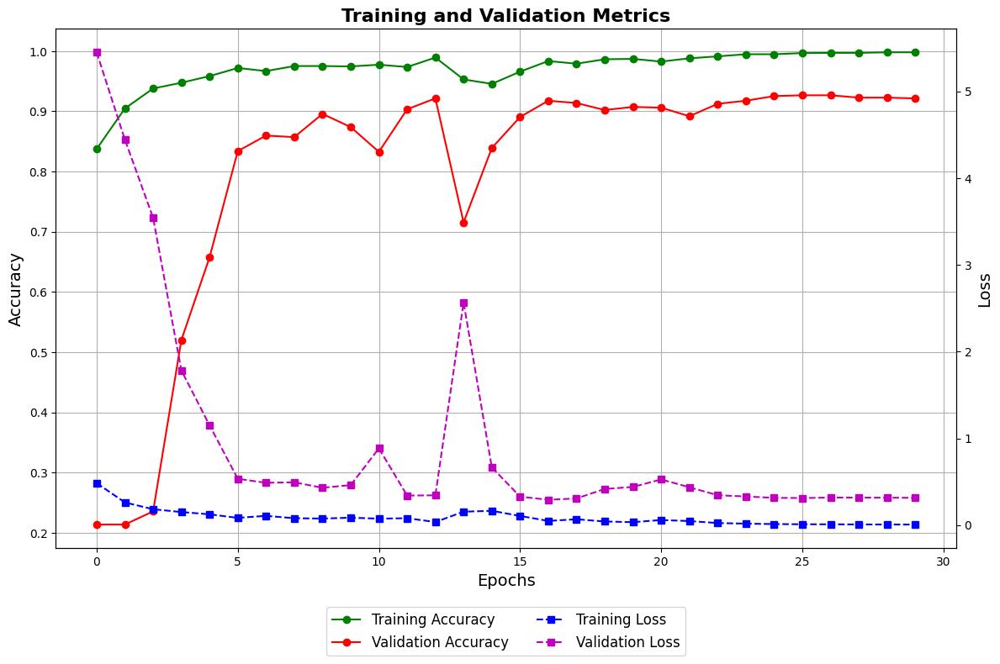

In [32]:
import matplotlib.pyplot as plt

epochs = range(len(history.history['accuracy']))

fig, ax1 = plt.subplots(figsize=(12, 8))

ax1.plot(epochs, history.history['accuracy'], 'g-', marker='o', label='Training Accuracy')
ax1.plot(epochs, history.history['val_accuracy'], 'r-', marker='o', label='Validation Accuracy')
ax1.set_xlabel('Epochs', fontsize=14)
ax1.set_ylabel('Accuracy', fontsize=14)
ax1.tick_params(axis='y')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(epochs, history.history['loss'], 'b--', marker='s', label='Training Loss')
ax2.plot(epochs, history.history['val_loss'], 'm--', marker='s', label='Validation Loss')
ax2.set_ylabel('Loss', fontsize=14)
ax2.tick_params(axis='y')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2, fontsize=12)

plt.title('Training and Validation Metrics', fontsize=16, fontweight='bold')

fig.tight_layout()
plt.show()


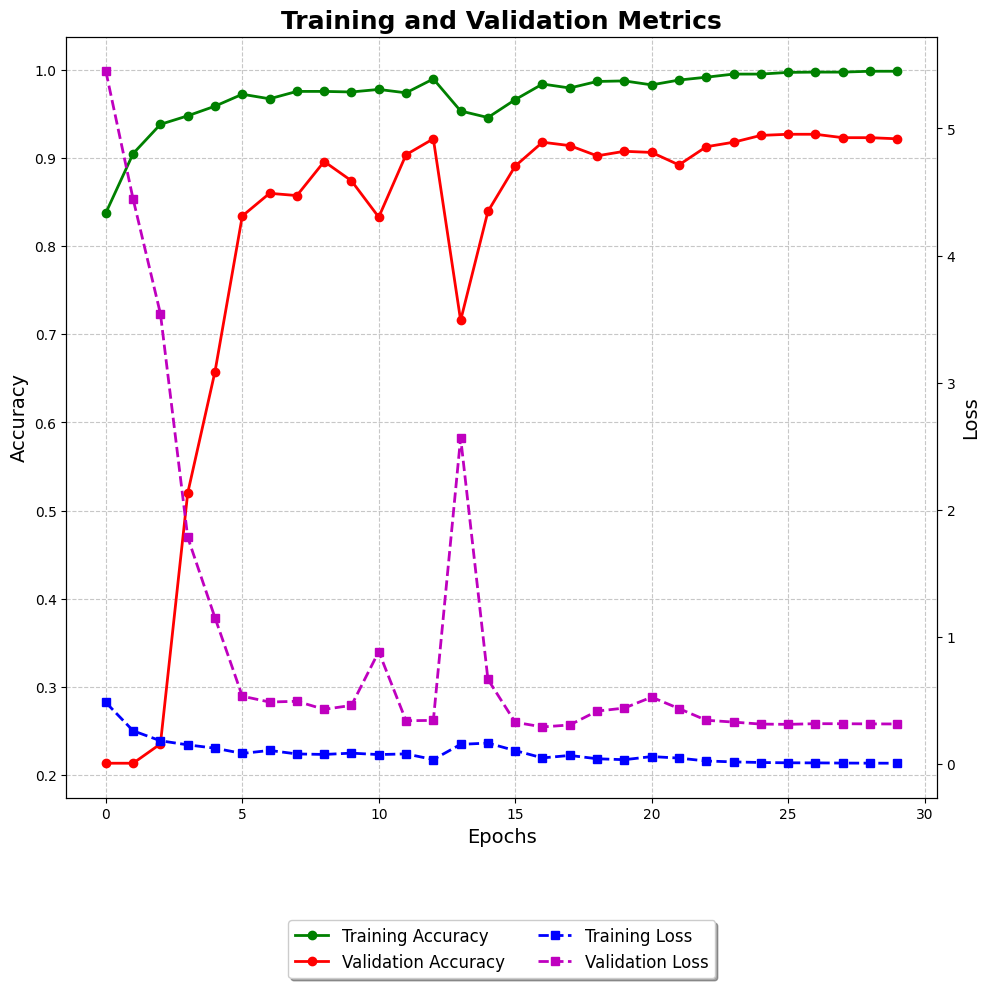

In [33]:
import matplotlib.pyplot as plt

epochs = range(len(history.history['accuracy']))

fig, ax1 = plt.subplots(figsize=(10, 10))  # Adjusting to a square figure size

ax1.plot(epochs, history.history['accuracy'], 'g-', marker='o', label='Training Accuracy', linewidth=2)
ax1.plot(epochs, history.history['val_accuracy'], 'r-', marker='o', label='Validation Accuracy', linewidth=2)
ax1.set_xlabel('Epochs', fontsize=14)
ax1.set_ylabel('Accuracy', fontsize=14)
ax1.tick_params(axis='y')
ax1.grid(True, linestyle='--', alpha=0.7)

ax2 = ax1.twinx()
ax2.plot(epochs, history.history['loss'], 'b--', marker='s', label='Training Loss', linewidth=2)
ax2.plot(epochs, history.history['val_loss'], 'm--', marker='s', label='Validation Loss', linewidth=2)
ax2.set_ylabel('Loss', fontsize=14)
ax2.tick_params(axis='y')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2, fontsize=12, frameon=True, shadow=True, fancybox=True)

plt.title('Training and Validation Metrics', fontsize=18, fontweight='bold')

fig.tight_layout()
plt.show()


### 5.3 *Visualize Predictions*

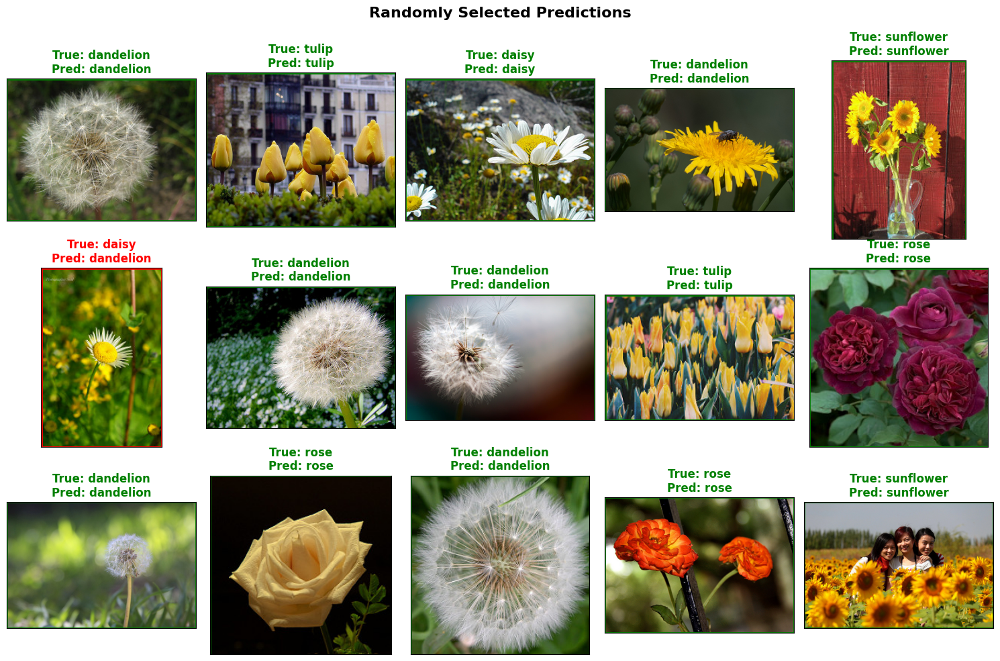

In [34]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

random_indices = np.random.choice(len(test_df), 15, replace=False)

fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    idx = random_indices[i]
    img = plt.imread(test_df.Filepath.iloc[idx])
    ax.imshow(img)
    
    true_label = test_df.Label.iloc[idx]
    predicted_label = pred[idx]
    color = 'green' if true_label == predicted_label else 'red'
    ax.set_title(f"True: {true_label}\nPred: {predicted_label}", color=color, fontsize=12, fontweight='bold')
    
    rect = patches.Rectangle((0, 0), img.shape[1], img.shape[0], linewidth=2, edgecolor=color, facecolor='none')
    ax.add_patch(rect)
    
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.suptitle('Randomly Selected Predictions', fontsize=16, fontweight='bold')
plt.show()


----


Original shape: (1920, 1280, 3)
Resized shape: (224, 224, 3)
Model input shape: (1, 224, 224, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Raw model output: [[0. 0. 1. 0. 1.]]
Predicted category: roses


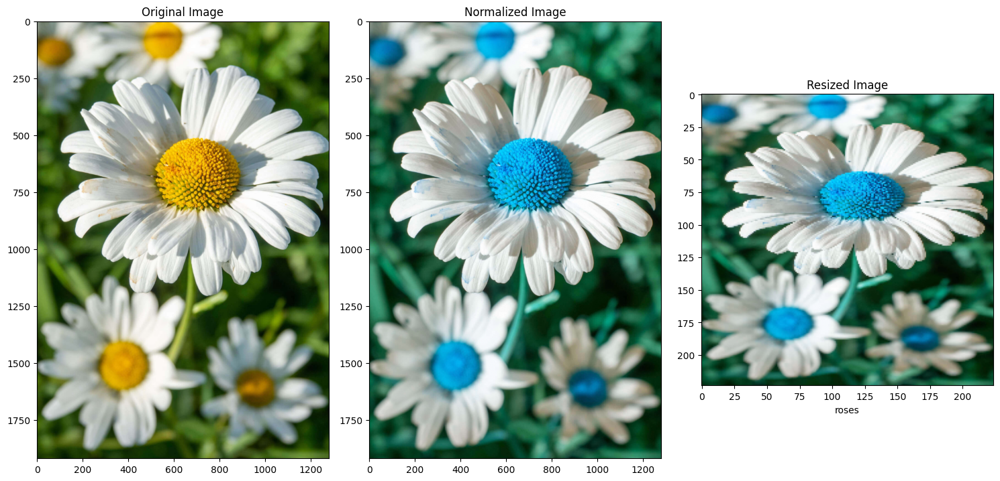

In [35]:
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import cv2
from tensorflow.keras.models import load_model

def process_image(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    fig, ax = plt.subplots(1, 3, figsize=(15, 20))
    ax[0].imshow(img)
    ax[0].set_title('Original Image')
    
    img = np.array(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    print(f"Original shape: {img.shape}")
    img = img / 255.0
    ax[1].imshow(img)
    ax[1].set_title('Normalized Image')
    
    img = cv2.resize(img, (224, 224)) 
    print(f"Resized shape: {img.shape}")
    ax[2].imshow(img)
    ax[2].set_title('Resized Image')
    plt.tight_layout()
    
    img = np.expand_dims(img, axis=0)
    print(f"Model input shape: {img.shape}")
    return img

def predict(url, model, categories):
    img = process_image(url)
    label = model.predict(img)
    print(f"Raw model output: {label}")
    final_1 = np.argmax(label, axis=1)[0]
    plt.xlabel(categories[final_1])
    return categories[final_1]

# Example usage:
model = load_model('C:/Users/ASUS/Desktop/ANN/models/EfficientNetB1/model_224.keras')  # Ensure correct path and format
categories = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']  # Replace with your actual categories

prediction = predict("https://www.wholesalenurseryco.com/cdn/shop/files/OxeyeDaisy_1_1_1.jpg?v=1709935028", model, categories)
print(f"Predicted category: {prediction}")



In [36]:
print(train_df.columns)


Index(['Filepath', 'Label'], dtype='object')


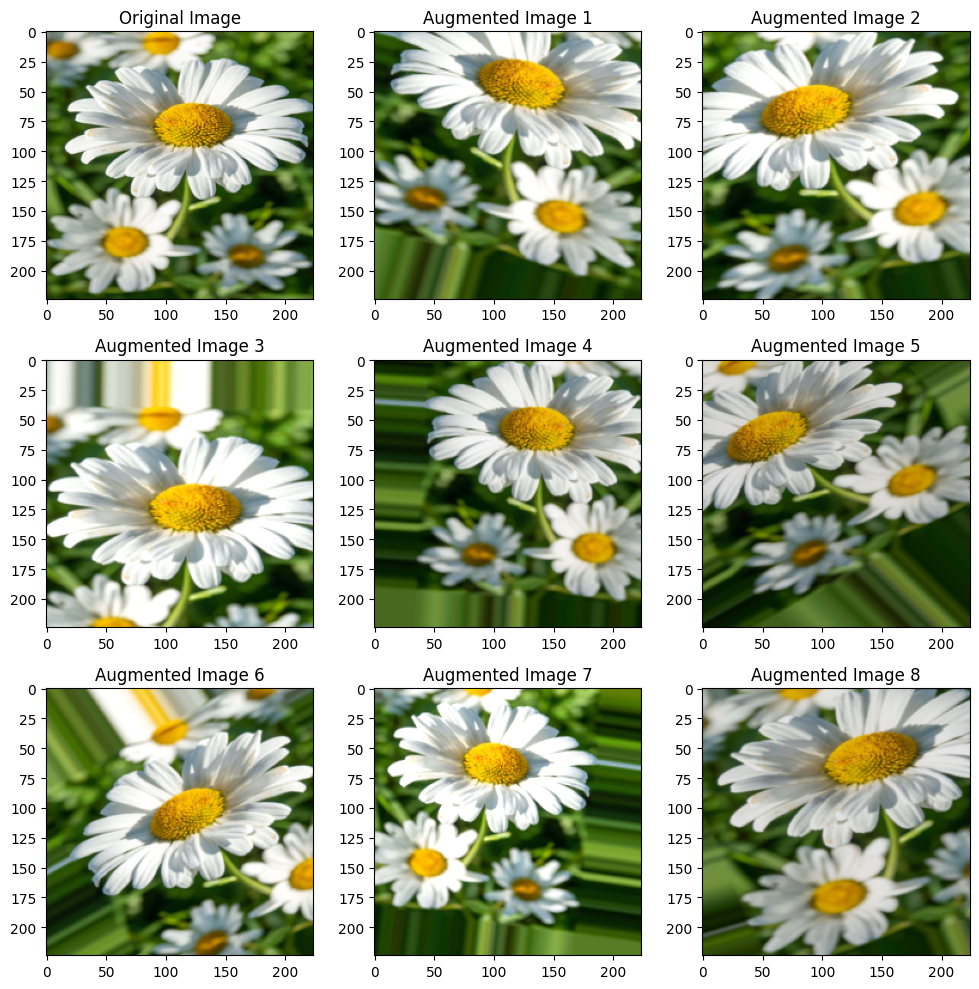

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array
from PIL import Image
import requests
from io import BytesIO

image_url = "https://www.wholesalenurseryco.com/cdn/shop/files/OxeyeDaisy_1_1_1.jpg?v=1709935028"
response = requests.get(image_url)
sample_image = Image.open(BytesIO(response.content))
sample_image = sample_image.resize((224, 224))  # Resize for consistency with typical model input size
sample_image_array = img_to_array(sample_image)
sample_image_array = np.expand_dims(sample_image_array, axis=0)

datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.8, 1.2],
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

augmented_images_iterator = datagen.flow(sample_image_array, batch_size=1)

plt.figure(figsize=(10, 10))
plt.subplot(3, 3, 1)
plt.imshow(sample_image)
plt.title('Original Image')

for i in range(8):
    plt.subplot(3, 3, i + 2)
    batch = next(augmented_images_iterator)
    augmented_image = batch[0].astype('uint8')
    plt.imshow(augmented_image)
    plt.title('Augmented Image {}'.format(i + 1))

plt.tight_layout()
plt.show()




In [38]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb1 (Functional)     │ (None, 7, 7, 1280)     │     6,575,239 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 56)             │        71,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,817,672 (75.60 MB)

 Trainable params: 6,585,205 (25.12 MB)

 Non-trainable params: 62,055 (242.41 KB)

 Optimizer params: 13,170,412 (50.24 MB)